In [1]:
import json
from pathlib import Path
import numpy as np
from scipy.ndimage import gaussian_filter1d

In [2]:
loaded = np.load("/build6k.npy", allow_pickle=True).item()

In [4]:
## Simple recursive approach
def compute_AALC(d):
    if 'accuracy_test' in d:
        acc_list = d['accuracy_test']
        d['aalc'] = np.mean(acc_list)
    else:
        for v in d.values():
            compute_AALC(v)
    return d

In [4]:
aalc_dict = compute_AALC(loaded)

In [5]:
aalc_dict

{'area': {'random': {'random': {'inf': {'1': {'accuracy_test': [0.5746666666666667,
       0.5906666666666667,
       0.6046666666666667,
       0.6166666666666667,
       0.592,
       0.648,
       0.6546666666666666,
       0.678,
       0.6786666666666666,
       0.674,
       0.6846666666666666,
       0.7026666666666667,
       0.708,
       0.7113333333333334,
       0.698,
       0.7013333333333334,
       0.7093333333333334,
       0.712,
       0.7053333333333334,
       0.718,
       0.716,
       0.7093333333333334,
       0.7153333333333334,
       0.7226666666666667,
       0.7186666666666667,
       0.712,
       0.7053333333333334,
       0.7253333333333334,
       0.716,
       0.714,
       0.7133333333333334,
       0.7106666666666667,
       0.7213333333333334,
       0.72,
       0.7306666666666667,
       0.7153333333333334,
       0.7233333333333334,
       0.7186666666666667,
       0.7166666666666667,
       0.7186666666666667,
       0.7226666666666667,
      

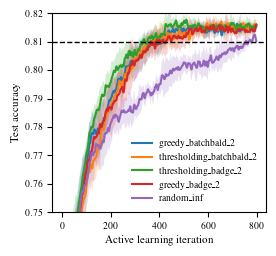

In [5]:
import matplotlib.pyplot as plt

# global rcParams
plt.rcParams.update({
    'font.size': 8,
    'font.family': 'serif',
    'axes.titlesize': 8,
    'axes.labelsize': 8,
    'xtick.labelsize': 7,
    'ytick.labelsize': 7,
    'legend.fontsize': 7,
    'text.usetex': True,
    'font.serif': ['Times'],
})

# figure size (in inches)
width_in, height_in = 2.8, 2.6
fig, ax = plt.subplots(figsize=(width_in, height_in))

# define your four experiments 
experiments = [
    {
        'name': 'greedy_batchbald_2',                    # label in the legend
        'path': ('distance', 'threshold', 'midropout', '2'), # dict keys above the seed
    },
    {
        'name': 'thresholding_batchbald_2',
        'path': ('distance', 'greedy', 'midropout', '2'),
    },
    {
        'name': 'thresholding_badge_2',
        'path': ('distance', 'threshold', 'badge', '2'),
    },
    {
        'name': 'greedy_badge_2',
        'path': ('distance', 'greedy', 'badge', '2'),
    },
    {
        'name': 'random_inf',
        'path': ('distance', 'random', 'random', 'inf'),
    },
]

# list of 5 seed‐IDs 
seeds = ['1', '2', '3', '4', '5']  # 

# 5) smoothing parameter
do_smooth = True
sigma = 2  # Gaussian kernel std; tweak to taste

# 6) loop over experiments
for exp in experiments:
    cfg, algo, acq, budget = exp['path']
    # collect all 5 curves
    curves = []
    for seed in seeds:
        acc = np.array(
            aalc_dict[cfg][algo][acq][budget][seed]['accuracy_test']
        )
        if do_smooth:
            acc = gaussian_filter1d(acc, sigma=sigma)
        curves.append(acc)
    data = np.vstack(curves)              # shape (5, n_iters)
    mean_acc = data.mean(axis=0)
    std_acc  = data.std(axis=0)
    iters = np.arange(len(mean_acc))

    # plot mean curve
    ax.plot(iters, mean_acc, label=exp['name'], linewidth=1.5)
    # shaded  ±1 std
    ax.fill_between(iters,
                    mean_acc - std_acc,
                    mean_acc + std_acc,
                    alpha=0.2)
    
ax.axhline(y=0.81, color='black', linestyle='--', linewidth=1)
# Set y-axis limits
ax.set_ylim(0.75, 0.82)

# 7) decorate & save
ax.set_xlabel("Active learning iteration")
ax.set_ylabel("Test accuracy")
# ax.set_title("Mean Learning Curves ±1 Std (5 Seeds)")
ax.legend(ncol=1, loc='lower right', frameon=False)
plt.tight_layout()

# 7) save as PDF
fig.savefig("learning_curves_a.pdf", dpi=300)

## Second figure

In [2]:
loaded_nieman = np.load("/Users/pmoratodomingu/Documents/_results_conbatch/nieman17k.npy", allow_pickle=True).item()

In [5]:
aalc_dict_nieman = compute_AALC(loaded_nieman)

In [6]:
len(aalc_dict_nieman['area']['threshold']['badge']['101']['3']['accuracy_test'])

800

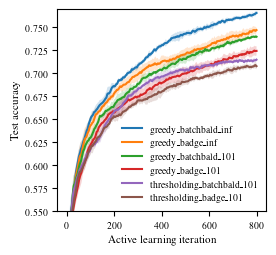

In [9]:
import matplotlib.pyplot as plt

# global rcParams
plt.rcParams.update({
    'font.size': 8,
    'font.family': 'serif',
    'axes.titlesize': 8,
    'axes.labelsize': 8,
    'xtick.labelsize': 7,
    'ytick.labelsize': 7,
    'legend.fontsize': 7,
    'text.usetex': True,
    'font.serif': ['Times'],
})

# figure size (in inches)
width_in, height_in = 2.8, 2.6
fig, ax = plt.subplots(figsize=(width_in, height_in))

# define your four experiments 
experiments = [
    {
        'name': 'greedy_batchbald_inf',
        'path': ('area', 'greedy', 'midropout', 'inf'),
    },
    {
        'name': 'greedy_badge_inf',
        'path': ('area', 'greedy', 'badge', 'inf'),
    },
    {
        'name': 'greedy_batchbald_101',
        'path': ('area', 'greedy', 'midropout', '101'),
    },
    {
        'name': 'greedy_badge_101',
        'path': ('area', 'greedy', 'badge', '101'),
    },
    {
        'name': 'thresholding_batchbald_101',                    # label in the legend
        'path': ('area', 'threshold', 'midropout', '101'), # dict keys above the seed
    },
    {
        'name': 'thresholding_badge_101',
        'path': ('area', 'threshold', 'badge', '101'),
    },
]

# list of 5 seed‐IDs 
seeds = ['1', '2', '3', '4', '5']  # 

# 5) smoothing parameter
do_smooth = True
sigma = 2  # Gaussian kernel std; tweak to taste

# 6) loop over experiments
for exp in experiments:
    cfg, algo, acq, budget = exp['path']
    # collect all 5 curves
    curves = []
    for seed in seeds:
        acc = np.array(
            aalc_dict_nieman[cfg][algo][acq][budget][seed]['accuracy_test']
        )
        if do_smooth:
            acc = gaussian_filter1d(acc, sigma=sigma)
        curves.append(acc)
    data = np.vstack(curves)              # shape (5, n_iters)
    mean_acc = data.mean(axis=0)
    std_acc  = data.std(axis=0)
    iters = np.arange(len(mean_acc))

    # plot mean curve
    ax.plot(iters, mean_acc, label=exp['name'], linewidth=1.5)
    # shaded  ±1 std
    ax.fill_between(iters,
                    mean_acc - std_acc,
                    mean_acc + std_acc,
                    alpha=0.2)
    
ax.axhline(y=0.81, color='black', linestyle='--', linewidth=1)
# Set y-axis limits
ax.set_ylim(0.55, 0.77)

# 7) decorate & save
ax.set_xlabel("Active learning iteration")
ax.set_ylabel("Test accuracy")
# ax.set_title("Mean Learning Curves ±1 Std (5 Seeds)")
ax.legend(ncol=1, loc='lower right', frameon=False)
plt.tight_layout()

# 7) save as PDF
fig.savefig("learning_curves_b.pdf", dpi=300)